In [6]:
# %load /Users/wayment/ipynb_defaults.py
%pylab inline
import numpy as np
import pandas as pd

import seaborn as sns
sns.set_style('ticks')
sns.set_context('paper')
import sys
from copy import deepcopy

%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


/Users/wayment/opt/miniconda3/lib/python3.8/site-packages/IPython/core/magics/pylab.py:162: UserWarning: pylab import has clobbered these variables: ['split']
`%matplotlib` prevents importing * from pylab and numpy
  warn("pylab import has clobbered these variables: %s"  % clobbered +


In [18]:
df = pd.read_json('RYOS_FULL_23Jul2021.json.zip')
print(df.groupby(['RYOS','SN_filter','split']).size())

RYOS  SN_filter  split       
1     0.0        public_train     811
      1.0        private_test     629
                 public_test      400
                 public_train    1189
2     0.0        nan              520
      1.0        nan             1321
                 private_test    1172
dtype: int64


In [19]:
df.head()

,index,ID,MAPseq,chemical,construct,design_name,errors,experimentType,filename,modifier,...,errors_deg_Mg_pH10,deg_Mg_50C,signal_to_noise_deg_Mg_50C,errors_deg_Mg_50C,EternaScore,split,SN_filter,structure,RYOS,test_filter
0,0,9830366,[tag:RTB001],"[MgCl2:10mM, HEPES:50mM(pH8.0)]",EteRNA Cloud Lab,testing,"[0.1689, 0.2323, 0.193, 0.17420000000000002, 0...",[StandardState],../../data/RYOS-I/RYOS1_SHAPE_0001.rdat,[1M7],...,"[0.3058, 0.3294, 0.233, 0.1693, 0.233900000000...","[0.7885000000000001, 1.9300000000000002, 2.042...",3.746,"[0.2773, 0.328, 0.3048, 0.22260000000000002, 0...",95.3,public_train,1.0,.......((((((...))))))((((.....))))((((((..(((...,1,NaN
1,1,9831675,[tag:RTB001],"[MgCl2:10mM, HEPES:50mM(pH8.0)]",EteRNA Cloud Lab,ZZ-1,"[0.6057, 0.8286, 0.5226000000000001, 0.5129, 0...",[StandardState],../../data/RYOS-I/RYOS1_SHAPE_0001.rdat,[1M7],...,"[0.9099, 1.1841, 0.4852, 0.5247, 0.6292, 0.411...","[0.9981000000000001, 2.9047, 0.5087, 0.6408, 0...",0.964,"[0.7993, 1.1159, 0.5803, 0.5544, 0.5905, 0.354...",76.6,public_test,1.0,.......(((((((.(((((((....)).))))).)))))))((((...,1,NaN
2,2,9831995,[tag:RTB001],"[MgCl2:10mM, HEPES:50mM(pH8.0)]",EteRNA Cloud Lab,ZZ-2,"[0.3682, 0.4864, 0.5109, 0.4582, 0.2102, 0.163...",[StandardState],../../data/RYOS-I/RYOS1_SHAPE_0001.rdat,[1M7],...,"[0.6859000000000001, 0.794, 0.4957000000000000...","[1.9769, 3.2621, 1.0129, 1.8319, 0.5724, 1.055...",1.459,"[0.7904, 0.9544, 0.5684, 0.6785, 0.433, 0.5437...",70.3,public_test,1.0,......((((((.((......))))))))....((((((((((((....,1,NaN
3,3,9831997,[tag:RTB001],"[MgCl2:10mM, HEPES:50mM(pH8.0)]",EteRNA Cloud Lab,ZZ-3,"[0.22190000000000001, 0.2932, 0.23800000000000...",[StandardState],../../data/RYOS-I/RYOS1_SHAPE_0001.rdat,[1M7],...,"[0.3501, 0.3992, 0.2645, 0.1908, 0.19340000000...","[0.5293, 1.4922, 1.381, 0.7905000000000001, 0....",2.669,"[0.30970000000000003, 0.456, 0.365, 0.27990000...",92.2,public_test,1.0,......((((.(.((.(((....((..((((((((....).)))))...,1,NaN
4,4,9832009,[tag:RTB001],"[MgCl2:10mM, HEPES:50mM(pH8.0)]",EteRNA Cloud Lab,ZZ-4,"[0.0805, 0.1129, 0.0983, 0.08220000000000001, ...",[StandardState],../../data/RYOS-I/RYOS1_SHAPE_0001.rdat,[1M7],...,"[0.1451, 0.16060000000000002, 0.1046, 0.0805, ...","[0.7547, 1.3451, 1.5152999999999999, 0.7102, 0...",7.183,"[0.11380000000000001, 0.1489, 0.1237, 0.089900...",93.8,public_test,1.0,.......(((((((((.....)))))).)))..((((.(((((.((...,1,NaN


In [20]:
print(df.keys())

Index(['index', 'ID', 'MAPseq', 'chemical', 'construct', 'design_name',
       'errors', 'experimentType', 'filename', 'modifier', 'processing',
       'project_name', 'reactivity', 'seqpos', 'sequence', 'signal_to_noise',
       'temperature', 'signal_to_noise_reactivity', 'errors_reactivity',
       'deg_pH10', 'signal_to_noise_deg_pH10', 'errors_deg_pH10', 'deg_50C',
       'signal_to_noise_deg_50C', 'errors_deg_50C', 'deg_Mg_pH10',
       'signal_to_noise_deg_Mg_pH10', 'errors_deg_Mg_pH10', 'deg_Mg_50C',
       'signal_to_noise_deg_Mg_50C', 'errors_deg_Mg_50C', 'EternaScore',
       'split', 'SN_filter', 'structure', 'RYOS', 'test_filter'],
      dtype='object')


In [13]:
df_I = df.loc[df.RYOS==1]
df_I = df_I.sort_values(['SN_filter'])
df_I = df_I.iloc[:-1] #remove P4P6 reference

df_tmp = pd.DataFrame()
for split in ['public_train', 'public_test', 'private_test']:
    tmp = df_I.loc[df_I.split==split]
    df_tmp = df_tmp.append(tmp, ignore_index=True)
df_I = deepcopy(df_tmp)

df_II = df.loc[df.RYOS==2]
df_II = df_II.sort_values(['SN_filter','test_filter'])

/var/folders/dz/yxswm4nd5gn8qr7s1_h0x71r0000gn/T/ipykernel_48235/1570898915.py:8: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df_tmp = df_tmp.append(tmp, ignore_index=True)


## Heatmaps of all datasets

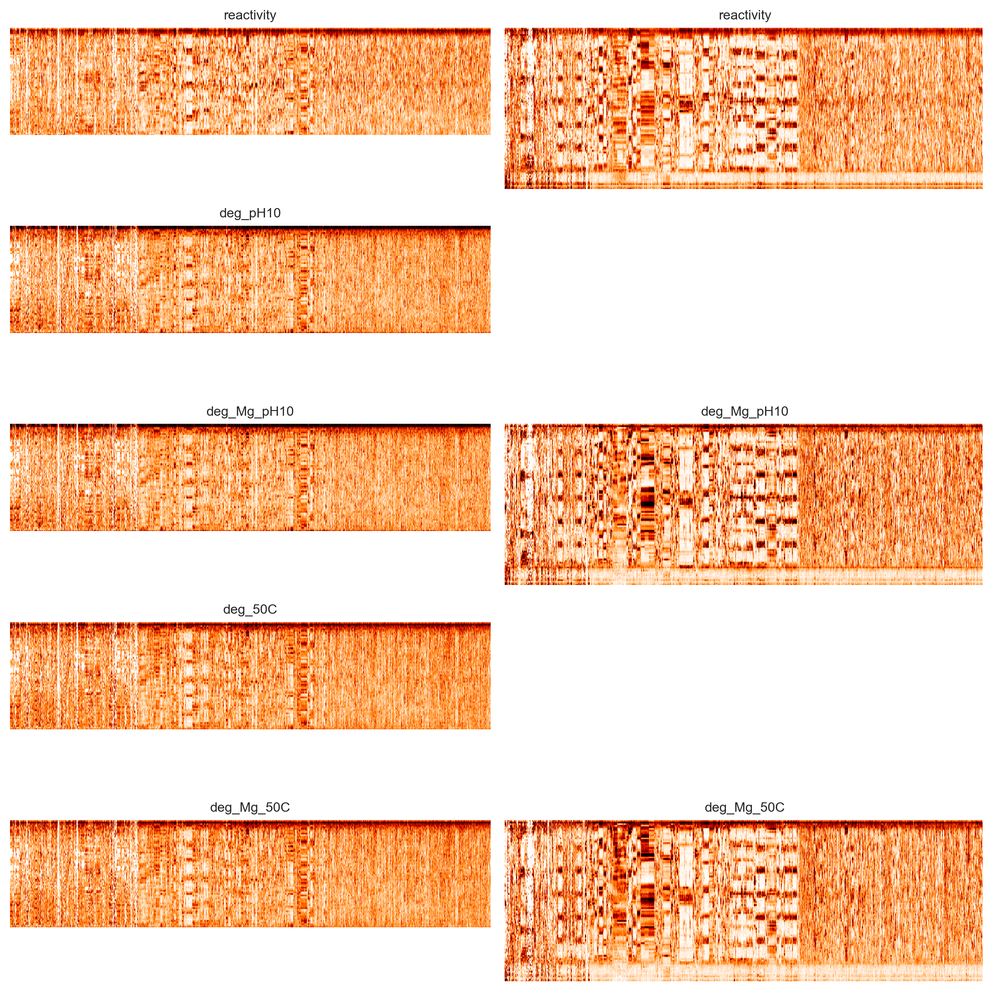

In [10]:
from matplotlib import cm
from matplotlib.colors import ListedColormap, LinearSegmentedColormap


data_types=['reactivity','deg_pH10','deg_Mg_pH10','deg_50C','deg_Mg_50C']
figure(figsize=(10,10))

red_scale = cm.get_cmap('gist_heat_r', 2000)

newcolors = red_scale(np.linspace(0, 1, 2000))
newcolors = np.concatenate([np.array([[0,0,0,0]]),newcolors])
newcmp = ListedColormap(newcolors)

for j,typ in enumerate(data_types):
    subplot(5,2,2*j+1)
    arr = -1000*np.ones([107,3029])
    
    arr[:68,:3029] = np.clip(np.vstack([x for x in df_I[typ]]).T,-1,2)
    #print(np.min(arr))
    imshow(arr,aspect=10, vmin=-.01, vmax=2, cmap=newcmp)
    title(typ)
    axis('off')
    
ryos_ii_inds=[0,2,4]
for ind in ryos_ii_inds:
    arr = -1000*np.ones([107,3029])
    arr[:102,:3013] = np.clip(np.vstack([x for x in df_II[data_types[ind]]]).T,-1,2)

    subplot(5,2,2*ind+2)
    imshow(arr,aspect=10,vmin=-.01, vmax=2, cmap=newcmp)
    title(data_types[ind])
    axis('off')
    
tight_layout()

# example of data types for single construct

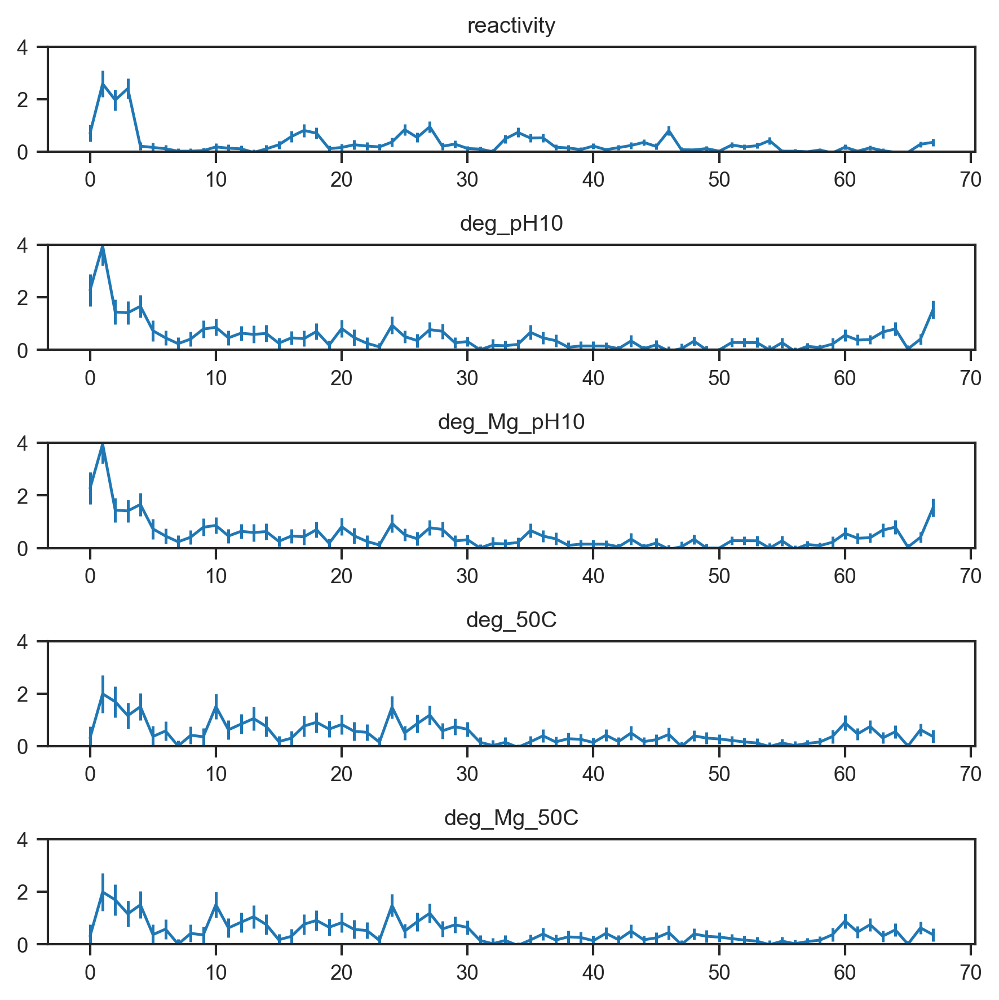

In [12]:
df_I['errors_reactivity'] = df_I['errors']
figure(figsize=(6,6))
for j, typ in enumerate(['reactivity','deg_pH10','deg_Mg_pH10','deg_50C','deg_Mg_50C']):
    subplot(5,1,j+1)
    errorbar(range(68), df_I.iloc[2000][typ], df_I.iloc[2000]['errors_%s' % typ],label=typ)
    ylim([0,4])
    title(typ)

tight_layout()
#savefig('example_prediction.pdf',bbox_inches='tight')

In [22]:
# helper functions

In [24]:
def melt_on_nt(df, vec_keys, string_keys,length=91):

#     for x in vec_keys:
#         print(x, df[x][0][:91], len(df[x][0]))
#     for x in string_keys:
#         print(x, len(df[x][0]))
    for k in string_keys:
        print('trimming', k)
        df['trimmed_%s' % k] = df.apply(lambda row: row['%s' % k][:length],axis=1)
    
    dct={k:np.concatenate([x[:length] for x in df[k]]) for k in vec_keys}
    
    dct.update({k:np.concatenate([list(x) for x in df['trimmed_%s' % k]]) for k in string_keys})

    for k, v in dct.items():
        print(k, len(v))
    new_df = pd.DataFrame(dct)
    return new_df

def get_difference_construct(data_df, model_df):
    '''Get RMS difference per construct.'''
    #vec_keys=[k for k in model_df.keys() if isinstance(model_df[k].iloc[0],list)]
    vec_keys=['deg_Mg_50C', 'deg_Mg_pH10', 'reactivity']
    print(vec_keys)
    for k in vec_keys:
        rmse=[]
        rmse_vec=[]
        clean_vec=[]
        for i, j in list(zip(data_df[k],model_df[k])):
            i,j = np.array(i, dtype=np.float), np.array(j, dtype=np.float)
            i,j = i[np.where(~np.isnan(i))], j[np.where(~np.isnan(j))]
            i = i[:len(j)]

            clean_vec.append(j)
            rmse.append(np.sqrt(np.sum(np.square(i-j))))
            rmse_vec.append(np.square(i-j))
            
        model_df['rmse_%s' % k] = rmse
        model_df['rmse_vec_%s' % k] = rmse_vec
        model_df[k] = clean_vec
    return model_df
    
#df = clean_df_of_None(df)

from scipy.stats import spearmanr
def corrfunc(x,y, draw_line=False, method='spearman', make_title=False, ax=None, **kws):

    if method=='spearman':
        r, pval = spearmanr(x, y, nan_policy='omit')
    elif method=='pearson':
        r, pval = pearsonr(x, y)

    ax = ax or plt.gca() 

    if draw_line:
        m, b = np.poly1d(np.polyfit(x, y, 1))
        xmin, xmax = ax.get_xlim()
        plt.plot([xmin,xmax],[xmin*m+b,xmax*m+b],c='k',linestyle=':')
        ax.set_xlim([xmin,xmax])

    if make_title:
        if method=='spearman':
            ax.set_title(f'Spearman R = {r:.2f}',loc='right')
        elif method=='pearson':
            ax.set_title(f'Pearson R = {r:.2f}',loc='right')
    else:
        if method=='spearman':
            ax.annotate(f'Spearman R = {r:.2f}', xycoords='axes fraction',xy=(0.35,0.9))
            ax.annotate(f'p = {pval:.1E}', xycoords='axes fraction',xy=(0.35,0.85))

        elif method=='pearson':
            ax.annotate(f'Pearson R = {r:.2f}', xycoords='axes fraction',xy=(0.1,0.9))

In [26]:
#analyze nullrecurrent predictions
nr_df = pd.read_json('nullrecurrent_cleaned_12Aug2021.json.zip')
subset_of_df = df.merge(nr_df[['sequence','predicted_loop_type']], on='sequence',sort=True) # reduce to just those in nr_df

nr_df = get_difference_construct(subset_of_df, nr_df)


['deg_Mg_50C', 'deg_Mg_pH10', 'reactivity']


/var/folders/dz/yxswm4nd5gn8qr7s1_h0x71r0000gn/T/ipykernel_48235/2061398365.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  i,j = np.array(i, dtype=np.float), np.array(j, dtype=np.float)
/var/folders/dz/yxswm4nd5gn8qr7s1_h0x71r0000gn/T/ipykernel_48235/2061398365.py:30: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  i,j = np.array(i, d

In [28]:
nr_df.head()

,level_0,deg_50C,deg_Mg_50C,deg_Mg_pH10,deg_pH10,id,reactivity,index,sequence,structure,...,test_filter,errors_reactivity,errors_deg_Mg_50C,errors_deg_Mg_pH10,rmse_deg_Mg_50C,rmse_vec_deg_Mg_50C,rmse_deg_Mg_pH10,rmse_vec_deg_Mg_pH10,rmse_reactivity,rmse_vec_reactivity
0,0,"[0.6459773727, 2.6758819142, 1.3761734952, 0.9...","[0.4260924687, 2.6539603477, 1.3060885346, 0.9...","[0.44049596560000004, 1.9669101936, 0.74120279...","[2.4994817865, 4.4631479459, 1.2569126509, 0.8...",4a2f7a25b,"[0.3988553433, 1.9189401803, 1.0374787144, 0.5...",1109,GGAAAAAAAAAUAAAAGAAACAAAAUAAGCAAGCAACAGGUCAUAG...,............................(((.((...(((((...(...,...,1,"[0.434, 0.39890000000000003, 0.1771, 0.1075, 0...","[0.5416000000000001, 0.8251000000000001, 0.387...","[0.44260000000000005, 0.5303, 0.4335, 0.3025, ...",5.817534,"[0.01731657781856047, 0.599324243950985, 1.223...",6.220264,"[0.0017559480989963797, 1.3023607059765496, 0....",4.285671,"[0.348742991556921, 2.3936427374987166, 1.1053..."
1,1,"[0.6528087862, 2.7132639726, 1.3955259997, 0.9...","[0.43982974820000004, 2.7349653669, 1.34985042...","[0.4515724324, 2.0163543005, 0.7659010479, 0.5...","[2.4763536017, 4.4522729765, 1.2567870079, 0.8...",3f1fd5121,"[0.3831425104, 1.8433718009, 1.0060492695, 0.5...",951,GGAAAAAAAAAUAAAAGAAACAAAAUAAGCAAGCAGCAGGUCAUAG...,............................(((.((...(((((...(...,...,1,"[0.32070000000000004, 0.4021, 0.19290000000000...","[0.36010000000000003, 0.6768000000000001, 0.51...","[0.2495, 0.3184, 0.34600000000000003, 0.2701, ...",5.852070,"[0.12126395753143542, 0.37855147170659176, 0.0...",6.405625,"[0.11578532825141256, 3.486265181875645, 0.061...",3.676528,"[0.1792315640004141, 0.2659174062434491, 0.751..."
2,5,"[0.6913412909000001, 2.9109947788, 0.971456498...","[0.4402289721, 2.8879493809000003, 0.682809181...","[0.5427277072, 2.6192622529, 0.5450513807, 0.6...","[2.1885329231, 4.5672311974, 0.8498810038, 0.9...",02adfe04c,"[0.4599109679, 2.0114930272, 0.9524078953, 1.1...",51,GGAAAAACAAAACAAAAAGGCCGCCGUACAUCCCGACCGCCGAAAC...,.................((((.(((((((..(((((((((((.......,...,1,"[0.1918, 0.2615, 0.20120000000000002, 0.198700...","[0.25730000000000003, 0.41750000000000004, 0.2...","[0.1675, 0.2877, 0.1226, 0.1694, 0.1641, 0.154...",2.183397,"[0.11167027588774263, 0.07870795512337336, 0.0...",2.397480,"[0.0350542143433689, 1.2473812919528633, 0.112...",2.301324,"[0.04047702663733483, 0.8619136129535796, 0.01..."
3,6,"[0.6949267331, 2.9371489918, 0.976908940100000...","[0.4440961974, 2.9188881346, 0.6886344526, 0.9...","[0.5489715605000001, 2.6542594139, 0.549811042...","[2.2012055759, 4.6476925827999995, 0.867660866...",7564b0329,"[0.4782352675, 2.0911827015, 0.976725, 1.13962...",1732,GGAAAAACAAAACAAAAAGGCCGCCGUACAUCCCGACCGCCGAAAG...,.................((((.(((((((..(((((((((((.......,...,1,"[0.2982, 0.3785, 0.2908, 0.3422, 0.29910000000...","[0.406, 0.6917, 0.38480000000000003, 0.4446, 0...","[0.2624, 0.4132, 0.19590000000000002, 0.203700...",3.486956,"[0.16394708935993973, 1.5183460812325467, 0.35...",2.845805,"[0.00046965653450516354, 0.4172635644060315, 0...",2.800307,"[0.13724411802629655, 0.39675221764893825, 0.0..."
4,7,"[0.6872514688, 2.8852907711, 0.960653868000000...","[0.4394730694, 2.8629451729, 0.6734041253, 0.9...","[0.5420138772, 2.5781126665, 0.5334840767, 0.6...","[2.1647928079, 4.5032286805, 0.8334922849, 0.9...",370305317,"[0.4537161977, 1.9784176778, 0.940332563900000...",833,GGAAAAACAAAACAAAAAGGCCGCCGUACAUCCCGACCGCCGCGGG...,.................((((.(((((((..(((((((((((.......,...,1,"[0.26430000000000003, 0.34990000000000004, 0.2...","[0.29050000000000004, 0.5491, 0.3014, 0.3049, ...","[0.2136, 0.39280000000000004, 0.202, 0.2221000...",2.768880,"[0.0022021368155372137, 0.24775986790135096, 0...",3.121267,"[0.04627398016401669, 0.20467722080964013, 0.0...",2.899038,"[0.08030637940600555, 0.4102628955743045, 0.28..."


In [29]:
print(nr_df.keys())

Index(['level_0', 'deg_50C', 'deg_Mg_50C', 'deg_Mg_pH10', 'deg_pH10', 'id',
       'reactivity', 'index', 'sequence', 'structure', 'predicted_loop_type',
       'seq_length', 'seq_scored', 'EternaScore', 'test_filter',
       'errors_reactivity', 'errors_deg_Mg_50C', 'errors_deg_Mg_pH10',
       'rmse_deg_Mg_50C', 'rmse_vec_deg_Mg_50C', 'rmse_deg_Mg_pH10',
       'rmse_vec_deg_Mg_pH10', 'rmse_reactivity', 'rmse_vec_reactivity'],
      dtype='object')


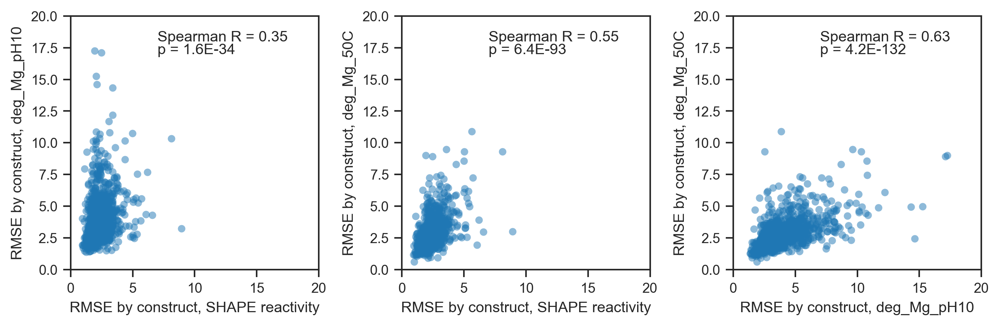

In [33]:
figure(figsize=(9,3))

subplot(1,3,1)
sns.scatterplot(x='rmse_reactivity',y='rmse_deg_Mg_pH10',data=nr_df,linewidth=0, alpha=0.5)
xlabel('RMSE by construct, SHAPE reactivity')
ylabel('RMSE by construct, deg_Mg_pH10')
corrfunc(nr_df['rmse_reactivity'], nr_df['rmse_deg_Mg_pH10'],pval=True)
xlim([0,20])
ylim([0,20])

subplot(1,3,2)
sns.scatterplot(x='rmse_reactivity',y='rmse_deg_Mg_50C',data=nr_df,linewidth=0, alpha=0.5)
xlabel('RMSE by construct, SHAPE reactivity')
ylabel('RMSE by construct, deg_Mg_50C')
corrfunc(nr_df['rmse_reactivity'], nr_df['rmse_deg_Mg_50C'],pval=True)
xlim([0,20])
ylim([0,20])

subplot(1,3,3)
sns.scatterplot(x='rmse_deg_Mg_pH10',y='rmse_deg_Mg_50C',data=nr_df,linewidth=0, alpha=0.5)
xlabel('RMSE by construct, deg_Mg_pH10')
ylabel('RMSE by construct, deg_Mg_50C')
corrfunc(nr_df['rmse_deg_Mg_pH10'], nr_df['rmse_deg_Mg_50C'],pval=True)
xlim([0,20])
ylim([0,20])

tight_layout()

In [37]:
# analyze error by nucleotide

melt_nr = melt_on_nt(nr_df,  ['deg_Mg_50C', 'deg_Mg_pH10', 'reactivity','errors_deg_Mg_50C', 'errors_deg_Mg_pH10', 'errors_reactivity',\
'rmse_vec_deg_Mg_50C', 'rmse_vec_deg_Mg_pH10', 'rmse_vec_reactivity'], ['sequence','predicted_loop_type','structure'])

melt_df = melt_on_nt(subset_of_df,['deg_Mg_50C', 'deg_Mg_pH10', 'reactivity', 'errors_deg_Mg_50C', 'errors_deg_Mg_pH10'],['sequence','predicted_loop_type','structure'])

for typ in ['deg_Mg_50C', 'deg_Mg_pH10', 'reactivity']:
    melt_nr['diff_to_err_%s' % typ] = melt_nr['rmse_vec_%s' % typ] - melt_nr['errors_%s' % typ]

trimming sequence
trimming predicted_loop_type
trimming structure
deg_Mg_50C 106652
deg_Mg_pH10 106652
reactivity 106652
errors_deg_Mg_50C 106652
errors_deg_Mg_pH10 106652
errors_reactivity 106652
rmse_vec_deg_Mg_50C 106652
rmse_vec_deg_Mg_pH10 106652
rmse_vec_reactivity 106652
sequence 106652
predicted_loop_type 106652
structure 106652
trimming sequence
trimming predicted_loop_type
trimming structure
deg_Mg_50C 106652
deg_Mg_pH10 106652
reactivity 106652
errors_deg_Mg_50C 106652
errors_deg_Mg_pH10 106652
sequence 106652
predicted_loop_type 106652
structure 106652


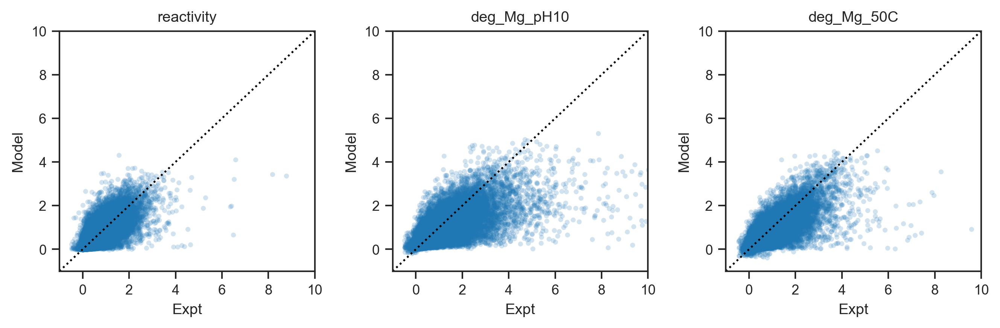

In [38]:
figure(figsize=(9,3))
xmax=10
for j, typ in enumerate(['reactivity', 'deg_Mg_pH10','deg_Mg_50C', ]):
    subplot(1,3,j+1)
    scatter(melt_df[typ], melt_nr[typ], alpha=0.2,linewidth=0,s=10)
    xlabel('Expt')
    ylabel('Model')
    plot([-1,xmax],[-1,xmax],color='k',linestyle=':')
    xlim([-1,10])
    ylim([-1,10])
    title(typ)
tight_layout()
